# Сегментация зданий на спутниковых снимках

В ноутбуке показаны:

1. Загрузка и визуализация данных

2. Обучение моделей

3. Тестирование и анализ результатов

4. Выводы

5. Описание приложения



Исходный датасет:
https://project.inria.fr/aerialimagelabeling/download/

Данный датасет содержит снимки 5000x5000 пикселей.

Всего в данных 180 снимков, которые вручную разбил на train, val, test по 126, 27, 27 снимков соответственно

Все изображения разбиты на патчи 512x512 пикселей при помощи файла https://drive.google.com/file/d/1EPnG9WiBNZyUu1Z1-FEydfeEkO7m5axy/view?usp=sharing

В качестве исходного датасета в ноутбуке используются полученные таким образом порезанные снимки

# Загрузка данных и необходимых модулей

Кастомный датасет, даталоадер, модели, модули обучения и тестирования и др. необходимые файлы подгружаются в данный ноутбук отдельно с гугл диска

Почему-то с большими файлами загрузка через gdown у меня работает через раз. На всякий случай прямая ссылка:

https://drive.google.com/drive/folders/1JS8vEyTWkVXDMCrwJzU34EYGoHTCHuvV?usp=sharing

In [10]:
!pip install -q gdown

!gdown "https://drive.google.com/uc?id=1nB9-zyNRZPGvW_eVc4NPUKPofExEfiZ2" -O project.zip
!unzip -q project.zip

Downloading...
From (original): https://drive.google.com/uc?id=1nB9-zyNRZPGvW_eVc4NPUKPofExEfiZ2
From (redirected): https://drive.google.com/uc?id=1nB9-zyNRZPGvW_eVc4NPUKPofExEfiZ2&confirm=t&uuid=b2514c90-f4d1-4d2f-a94c-a9b18e4273a8
To: /content/project.zip
100% 380M/380M [00:03<00:00, 111MB/s]
replace weights/best_model.pth? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


Загрузка исходного датасета

In [ ]:
!gdown "https://drive.google.com/uc?id=1rUP1UU9IDFyBftEXbPlp3cRkebFC6-3t" -O data.zip
!unzip -q data.zip

Downloading...
From (original): https://drive.google.com/uc?id=1rUP1UU9IDFyBftEXbPlp3cRkebFC6-3t
From (redirected): https://drive.google.com/uc?id=1rUP1UU9IDFyBftEXbPlp3cRkebFC6-3t&confirm=t&uuid=6057e82d-7da0-44e9-a415-0116f133cda8
To: /content/data.zip
100% 7.70G/7.70G [01:43<00:00, 74.6MB/s]


## Импорты и директории

In [16]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import cv2
from PIL import Image
import torch
from torch.utils.data import DataLoader
from tqdm.notebook import tqdm
import pandas as pd
import json

plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')


sys.path.append('..')

# Импорты из загруенных модулей
from models.unet import get_unet_model
from utils.dataset import SatelliteDataset, get_training_augmentation, get_validation_augmentation
from utils.losses import get_loss_function
from utils.metrics import SegmentationMetrics, AreaCalculator
from utils.visualization import visualize_sample, visualize_comparison, plot_training_history

In [ ]:
from pathlib import Path
import torch


DATA_DIR = Path('/content/')

TRAIN_IMAGES = DATA_DIR / 'train' / 'images'
TRAIN_MASKS = DATA_DIR / 'train' / 'masks'
VAL_IMAGES = DATA_DIR / 'val' / 'images'
VAL_MASKS = DATA_DIR / 'val' / 'masks'
TEST_IMAGES = DATA_DIR / 'test' / 'images'
TEST_MASKS = DATA_DIR / 'test' / 'masks'


WEIGHTS_DIR = Path('/content/weights')
LOGS_DIR = Path('/content/logs')
RESULTS_DIR = Path('/content/results')


WEIGHTS_DIR.mkdir(exist_ok=True)
LOGS_DIR.mkdir(exist_ok=True)
RESULTS_DIR.mkdir(exist_ok=True)

# Устройство
if torch.cuda.is_available():
    DEVICE = torch.device('cuda')
elif torch.backends.mps.is_available():
    DEVICE = torch.device('mps')
else:
    DEVICE = torch.device('cpu')

print(f"Устройство: {DEVICE}")

Устройство: cuda


---
# 1. Загрузка и исследование данных

In [ ]:

train_dataset_raw = SatelliteDataset(
    str(TRAIN_IMAGES),
    str(TRAIN_MASKS),
    transform=None,
    mode='train'
)

val_dataset_raw = SatelliteDataset(
    str(VAL_IMAGES),
    str(VAL_MASKS),
    transform=None,
    mode='val'
)

print(f"Train samples: {len(train_dataset_raw)}")
print(f"Val samples: {len(val_dataset_raw)}")
print(f"Total: {len(train_dataset_raw) + len(val_dataset_raw)}")

Train samples: 10206
Val samples: 2187
Total: 12393


Анализируем датасеты

In [ ]:
def analyze_dataset(dataset, name='Dataset', n_samples=100):
    """
    Анализ датасета: размеры, процент застройки, статистика
    """
    stats = {
        'building_percentages': [],
        'num_building_pixels': [],
    }

    # Анализируем первые n_samples изображений
    n = min(n_samples, len(dataset))

    for i in tqdm(range(n), desc=f'Analyzing {name}'):
        sample = dataset[i]
        image = sample['image']
        mask = sample['mask']

        # Процент зданий
        building_pixels = np.sum(mask > 0.5)
        total_pixels = mask.size
        percentage = (building_pixels / total_pixels) * 100

        stats['building_percentages'].append(percentage)
        stats['num_building_pixels'].append(building_pixels)

    return stats

# Анализируем оба датасета
train_stats = analyze_dataset(train_dataset_raw, 'Train', n_samples=1000)
val_stats = analyze_dataset(val_dataset_raw, 'Val', n_samples=1000)

Analyzing Train:   0%|          | 0/1000 [00:00<?, ?it/s]

Analyzing Val:   0%|          | 0/1000 [00:00<?, ?it/s]

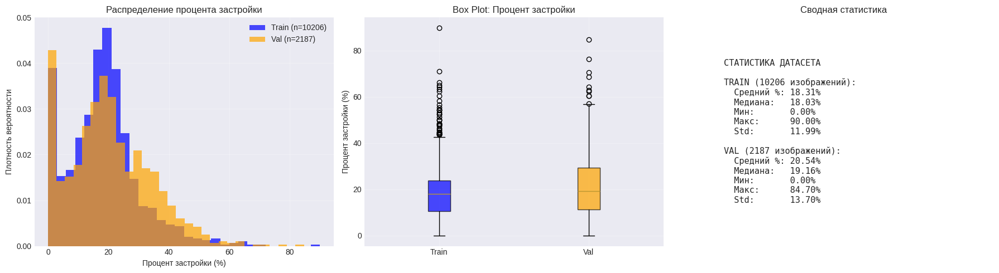

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# 1. Гистограмма распределения процента застройки
axes[0].hist(train_stats['building_percentages'], bins=30, alpha=0.7,
            label=f'Train (n={len(train_dataset_raw)})', color='blue', density=True)
axes[0].hist(val_stats['building_percentages'], bins=30, alpha=0.7,
            label=f'Val (n={len(val_dataset_raw)})', color='orange', density=True)
axes[0].set_xlabel('Процент застройки (%)')
axes[0].set_ylabel('Плотность вероятности')
axes[0].set_title('Распределение процента застройки')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# 2. Box plot
data_to_plot = [train_stats['building_percentages'], val_stats['building_percentages']]
bp = axes[1].boxplot(data_to_plot, labels=['Train', 'Val'], patch_artist=True)
bp['boxes'][0].set_facecolor('blue')
bp['boxes'][1].set_facecolor('orange')
bp['boxes'][0].set_alpha(0.7)
bp['boxes'][1].set_alpha(0.7)
axes[1].set_ylabel('Процент застройки (%)')
axes[1].set_title('Box Plot: Процент застройки')
axes[1].grid(True, alpha=0.3)

# 3. Сводная статистика
stats_text = f"""
СТАТИСТИКА ДАТАСЕТА

TRAIN ({len(train_dataset_raw)} изображений):
  Средний %: {np.mean(train_stats['building_percentages']):.2f}%
  Медиана:   {np.median(train_stats['building_percentages']):.2f}%
  Мин:       {np.min(train_stats['building_percentages']):.2f}%
  Макс:      {np.max(train_stats['building_percentages']):.2f}%
  Std:       {np.std(train_stats['building_percentages']):.2f}%

VAL ({len(val_dataset_raw)} изображений):
  Средний %: {np.mean(val_stats['building_percentages']):.2f}%
  Медиана:   {np.median(val_stats['building_percentages']):.2f}%
  Мин:       {np.min(val_stats['building_percentages']):.2f}%
  Макс:      {np.max(val_stats['building_percentages']):.2f}%
  Std:       {np.std(val_stats['building_percentages']):.2f}%
"""

axes[2].text(0.1, 0.5, stats_text, fontsize=11, family='monospace',
             verticalalignment='center', transform=axes[2].transAxes)
axes[2].axis('off')
axes[2].set_title('Сводная статистика')

plt.tight_layout()
plt.savefig(RESULTS_DIR / 'dataset_statistics.png', dpi=150, bbox_inches='tight')
plt.show()

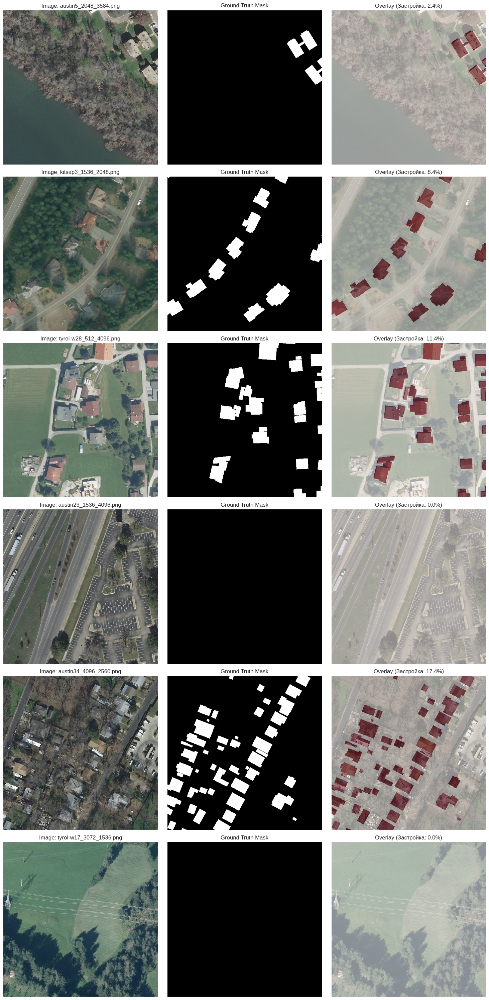

In [ ]:
# Показываем несколько случайных примеров
num_examples = 6
indices = np.random.choice(len(train_dataset_raw), num_examples, replace=False)

fig, axes = plt.subplots(num_examples, 3, figsize=(15, 5 * num_examples))

for i, idx in enumerate(indices):
    sample = train_dataset_raw[idx]
    image = sample['image']
    mask = sample['mask']
    filename = sample['filename']

    # Original image
    axes[i, 0].imshow(image)
    axes[i, 0].set_title(f'Image: {filename}')
    axes[i, 0].axis('off')

    # Mask
    axes[i, 1].imshow(mask, cmap='gray')
    axes[i, 1].set_title('Ground Truth Mask')
    axes[i, 1].axis('off')

    # Overlay
    axes[i, 2].imshow(image)
    axes[i, 2].imshow(mask, alpha=0.5, cmap='Reds')

    # Добавляем статистику
    building_pct = (np.sum(mask > 0.5) / mask.size) * 100
    axes[i, 2].set_title(f'Overlay (Застройка: {building_pct:.1f}%)')
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()


Промежуточные выводы:
Данные загружены и разбиты на train val test выборки.

Статистики тренировочной и валидационной выборки похожи, что хорошо.

Недостаток, в том что много зданий порезаны краями снимков, что может ухудшить качество предсказаний. Однако, обучение на снимках, например 1024x1024, где эти недостатки были бы менее выражены, будет занимать гораздо больше времени (resize же лучше не делать так как он будет размывать границы зданий), поэтому обработку исходных снимков считаю оптимальной

---
# 2. Обучение модели

## 2.1 Параметры обучения

**в файле models\unet.py построены 3 модели по типу Unet:**

1. Unet (обычный)

ConvTranspose для upsampling,
1024 канала в bottleneck,
31M параметров

2. Unet с bilinear=True

Билинейная интерполяция вместо ConvTranspose,
512 каналов в bottleneck,
18M параметров

3. Unet++

Вложенные skip connections,
Более плотные связи между уровнями

**Функции потерь реализованы в файле utils\losses.py:**

DiceLoss

FocalLoss

IoULoss

CombinedLoss (Dice + BCE)

CombinedLossV2 (Dice + Focal)

CombinedLossV3 (Dice + BCE + IoU)


In [ ]:
# Параметры обучения
TRAIN_CONFIG = {
    'model_type': 'unet++',  # 'unet', 'unet_bilinear', 'unet++'
    'loss_type': 'combined',         # 'dice', 'bce', 'combined', 'combined_v2', 'combined_v3'
    'batch_size': 8,
    'num_epochs': 10,
    'learning_rate': 1e-4,
    'image_size': 256,
    'num_workers': 0 if DEVICE.type == 'mps' else 4,
}

print("Конфигурация обучения:")
for key, value in TRAIN_CONFIG.items():
    print(f"  {key}: {value}")

Конфигурация обучения:
  model_type: unet++
  loss_type: combined
  batch_size: 8
  num_epochs: 10
  learning_rate: 0.0001
  image_size: 256
  num_workers: 4


## 2.2 Создание DataLoaders

In [ ]:
# Создаём датасеты С аугментациями
train_dataset = SatelliteDataset(
    str(TRAIN_IMAGES),
    str(TRAIN_MASKS),
    transform=get_training_augmentation(TRAIN_CONFIG['image_size']),
    mode='train'
)

val_dataset = SatelliteDataset(
    str(VAL_IMAGES),
    str(VAL_MASKS),
    transform=get_validation_augmentation(TRAIN_CONFIG['image_size']),
    mode='val'
)

# DataLoaders
train_loader = DataLoader(
    train_dataset,
    batch_size=TRAIN_CONFIG['batch_size'],
    shuffle=True,
    num_workers=TRAIN_CONFIG['num_workers'],
    pin_memory=True if DEVICE.type == 'cuda' else False
)

val_loader = DataLoader(
    val_dataset,
    batch_size=TRAIN_CONFIG['batch_size'],
    shuffle=False,
    num_workers=TRAIN_CONFIG['num_workers'],
    pin_memory=True if DEVICE.type == 'cuda' else False
)

print(f"Train loader: {len(train_loader)} батчей")
print(f"Val loader: {len(val_loader)} батчей")

Train loader: 1276 батчей
Val loader: 274 батчей


## 2.3 Создание модели

In [ ]:
# Создаём модель
model = get_unet_model(
    model_type=TRAIN_CONFIG['model_type'],
    n_channels=3,
    n_classes=1
)
model = model.to(DEVICE)

# Подсчёт параметров
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f"Модель: {TRAIN_CONFIG['model_type']}")
print(f"Всего параметров: {total_params:,}")
print(f"Обучаемых параметров: {trainable_params:,}")

# Loss и optimizer
criterion = get_loss_function(TRAIN_CONFIG['loss_type'])
optimizer = torch.optim.Adam(model.parameters(), lr=TRAIN_CONFIG['learning_rate'])
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=5
)

print(f"Loss: {TRAIN_CONFIG['loss_type']}")
print(f"Optimizer: Adam (lr={TRAIN_CONFIG['learning_rate']})")

Модель: unet++
Всего параметров: 36,622,337
Обучаемых параметров: 36,622,337
Loss: combined
Optimizer: Adam (lr=0.0001)


## 2.4 Обучение


In [ ]:
from train_seg import Trainer

trainer = Trainer(
     model=model,
     train_loader=train_loader,
     val_loader=val_loader,
     criterion=criterion,
     optimizer=optimizer,
     device=DEVICE,
     checkpoint_dir=str(WEIGHTS_DIR),
     log_dir=str(LOGS_DIR),
     resume_from=None
 )


trainer.train(num_epochs=TRAIN_CONFIG['num_epochs'], scheduler=scheduler)


Starting training for 10 epochs...
Device: cuda
Train batches: 1276
Val batches: 274
Start epoch: 1
------------------------------------------------------------


Epoch 1 [Val]: 100%|██████████| 274/274 [02:07<00:00,  2.15it/s, loss=0.4748, iou=0.2333, dice=0.3529]



Epoch 1/10:
  Train Loss: 0.4651 | Train IoU: 0.3348 | Train Dice: 0.4421
  Val Loss:   0.3665 | Val IoU:   0.4903 | Val Dice:   0.6020
  LR: 0.000100
✓ Saved best model with IoU: 0.4903


Epoch 2 [Val]: 100%|██████████| 274/274 [02:08<00:00,  2.13it/s, loss=0.4380, iou=0.2857, dice=0.4279]



Epoch 2/10:
  Train Loss: 0.3539 | Train IoU: 0.4304 | Train Dice: 0.5417
  Val Loss:   0.3033 | Val IoU:   0.5319 | Val Dice:   0.6435
  LR: 0.000100
✓ Saved best model with IoU: 0.5319


Epoch 3 [Val]: 100%|██████████| 274/274 [02:08<00:00,  2.14it/s, loss=0.3817, iou=0.2792, dice=0.4195]



Epoch 3/10:
  Train Loss: 0.3152 | Train IoU: 0.4823 | Train Dice: 0.5920
  Val Loss:   0.2652 | Val IoU:   0.5901 | Val Dice:   0.6942
  LR: 0.000100
✓ Saved best model with IoU: 0.5901


Epoch 4 [Val]: 100%|██████████| 274/274 [02:08<00:00,  2.13it/s, loss=0.3388, iou=0.2822, dice=0.3990]



Epoch 4/10:
  Train Loss: 0.2894 | Train IoU: 0.5162 | Train Dice: 0.6247
  Val Loss:   0.2466 | Val IoU:   0.6106 | Val Dice:   0.7127
  LR: 0.000100
✓ Saved best model with IoU: 0.6106


Epoch 5 [Val]: 100%|██████████| 274/274 [02:08<00:00,  2.13it/s, loss=0.2742, iou=0.3789, dice=0.5243]



Epoch 5/10:
  Train Loss: 0.2753 | Train IoU: 0.5351 | Train Dice: 0.6416
  Val Loss:   0.2262 | Val IoU:   0.6278 | Val Dice:   0.7286
  LR: 0.000100
✓ Saved best model with IoU: 0.6278


Epoch 6 [Val]: 100%|██████████| 274/274 [02:08<00:00,  2.12it/s, loss=0.2882, iou=0.3506, dice=0.4932]



Epoch 6/10:
  Train Loss: 0.2660 | Train IoU: 0.5444 | Train Dice: 0.6497
  Val Loss:   0.2246 | Val IoU:   0.6282 | Val Dice:   0.7284
  LR: 0.000100
✓ Saved best model with IoU: 0.6282


Epoch 7 [Val]: 100%|██████████| 274/274 [02:09<00:00,  2.12it/s, loss=0.2589, iou=0.4327, dice=0.5767]



Epoch 7/10:
  Train Loss: 0.2579 | Train IoU: 0.5576 | Train Dice: 0.6625
  Val Loss:   0.2142 | Val IoU:   0.6373 | Val Dice:   0.7364
  LR: 0.000100
✓ Saved best model with IoU: 0.6373


Epoch 8 [Val]: 100%|██████████| 274/274 [02:08<00:00,  2.13it/s, loss=0.2790, iou=0.3745, dice=0.5198]



Epoch 8/10:
  Train Loss: 0.2509 | Train IoU: 0.5679 | Train Dice: 0.6715
  Val Loss:   0.2054 | Val IoU:   0.6482 | Val Dice:   0.7448
  LR: 0.000100
✓ Saved best model with IoU: 0.6482


Epoch 9 [Val]: 100%|██████████| 274/274 [02:09<00:00,  2.12it/s, loss=0.2970, iou=0.3742, dice=0.5016]



Epoch 9/10:
  Train Loss: 0.2446 | Train IoU: 0.5747 | Train Dice: 0.6780
  Val Loss:   0.2059 | Val IoU:   0.6441 | Val Dice:   0.7413
  LR: 0.000100


Epoch 10 [Train]:   9%|▊         | 109/1276 [02:26<25:58,  1.34s/it, loss=0.2086, iou=0.7149, dice=0.8261]

К сожалению, беслатного колаба хватило только на 9 эпох

Saved best model with IoU: 0.6482

Загрузим обученную локально на 20 эпохах модель unet_bilinear

In [3]:
from pathlib import Path

WEIGHTS_DIR = Path('/content/weights')
WEIGHTS_DIR.mkdir(exist_ok=True)

In [4]:
!gdown "https://drive.google.com/uc?id=1Vm65F7-_8BFeVtT1axuFd2t7XF8XSaAK" -O /content/weights/best_model.pth

Downloading...
From (original): https://drive.google.com/uc?id=1Vm65F7-_8BFeVtT1axuFd2t7XF8XSaAK
From (redirected): https://drive.google.com/uc?id=1Vm65F7-_8BFeVtT1axuFd2t7XF8XSaAK&confirm=t&uuid=0504b2c8-1545-4566-bf8d-5714c1dffa85
To: /content/weights/best_model.pth
100% 207M/207M [00:01<00:00, 105MB/s]


In [7]:
# Устройство
if torch.cuda.is_available():
    DEVICE = torch.device('cuda')
elif torch.backends.mps.is_available():
    DEVICE = torch.device('mps')
else:
    DEVICE = torch.device('cpu')

print(f"Устройство: {DEVICE}")

Устройство: cpu


In [13]:
from models.unet import get_unet_model

model = get_unet_model(
    model_type='unet_bilinear',
    n_channels=3,
    n_classes=1
)
model = model.to(DEVICE)

---
# 3. Тестирование модели

## 3.1 Загрузка обученной модели

In [14]:
import torch

MODEL_PATH = WEIGHTS_DIR / 'best_model.pth'

if not MODEL_PATH.exists():
    print(f"Модель не найдена: {MODEL_PATH}")
else:
    # Загружаем веса
    checkpoint = torch.load(MODEL_PATH, map_location=DEVICE, weights_only=False)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.eval()

    print(f"Модель загружена из: {MODEL_PATH}")
    print(f"Эпоха: {checkpoint.get('epoch', 'unknown')}")
    print(f"Val IoU: {checkpoint.get('val_iou', 'unknown'):.4f}")
    print(f"Best Val IoU: {checkpoint.get('best_val_iou', 'unknown'):.4f}")

Модель загружена из: /content/weights/best_model.pth
Эпоха: 20
Val IoU: 0.6638
Best Val IoU: 0.6638


## 3.2 Тестирование на тестовой выборке

In [20]:
#!unzip -q test.zip

Starting evaluation...


Testing: 100%|██████████| 274/274 [1:10:34<00:00, 15.45s/it]



TEST RESULTS
IOU: 0.6699
DICE: 0.7747
PIXEL_ACCURACY: 0.9308
PRECISION: 0.7528
RECALL: 0.7940
F1: 0.7704

Area Statistics:
  Mean area: 1208.39 m²
  Median area: 1016.01 m²
  Min area: 0.00 m²
  Max area: 4877.01 m²

✓ Visualizations saved to /content/test_results/test_analysis.png

ТЕСТОВЫЕ РЕЗУЛЬТАТЫ:
  IOU            : 0.6699
  DICE           : 0.7747
  PIXEL_ACCURACY : 0.9308
  PRECISION      : 0.7528
  RECALL         : 0.7940
  F1             : 0.7704


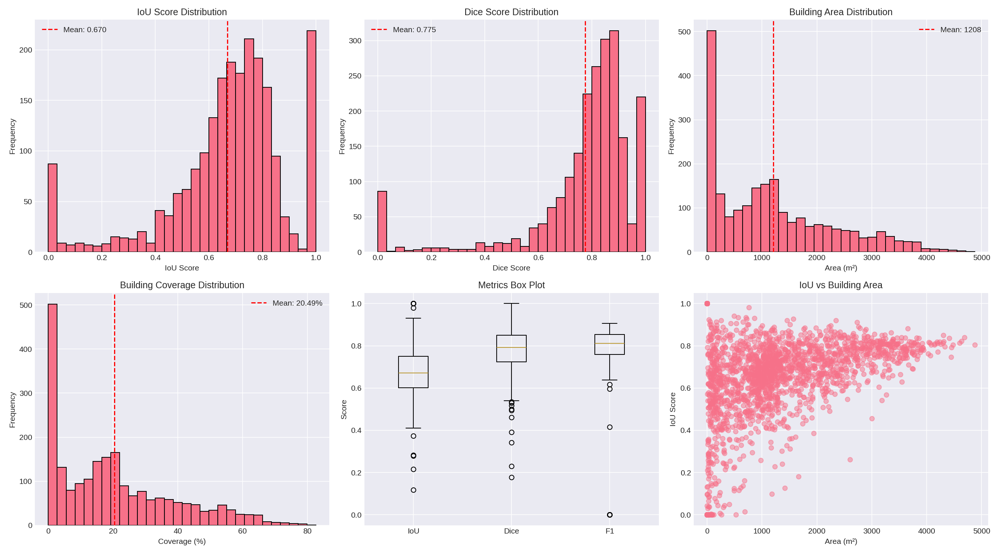

In [21]:
import sys
sys.path.append('.')
from test_model import test_model


#from models.unet import get_unet_model

torch.serialization.add_safe_globals([np._core.multiarray.scalar])

#model = get_unet_model('unet', 3, 1)
checkpoint = torch.load('/content/weights/best_model.pth', map_location=DEVICE, weights_only=False)
model.load_state_dict(checkpoint['model_state_dict'])
#model.to(DEVICE)
model.eval()

# Создаём тестовый датасет
#from utils.dataset import SatelliteDataset, get_validation_augmentation

test_dataset = SatelliteDataset(
    '/content/test/images',
    '/content/test/masks',
    transform=get_validation_augmentation(256),
    mode='test'
)

test_loader = torch.utils.data.DataLoader(
    test_dataset,
    batch_size=8,
    shuffle=False
)


results_dir = '/content/test_results'
avg_metrics, detailed_results = test_model(model, test_loader, DEVICE, save_dir=results_dir)


print("\nТЕСТОВЫЕ РЕЗУЛЬТАТЫ:")
for metric, value in avg_metrics.items():
    print(f"  {metric.upper():15}: {value:.4f}")


from IPython.display import Image
Image(filename=f'{results_dir}/test_analysis.png')

## 3.3 Примеры предсказаний

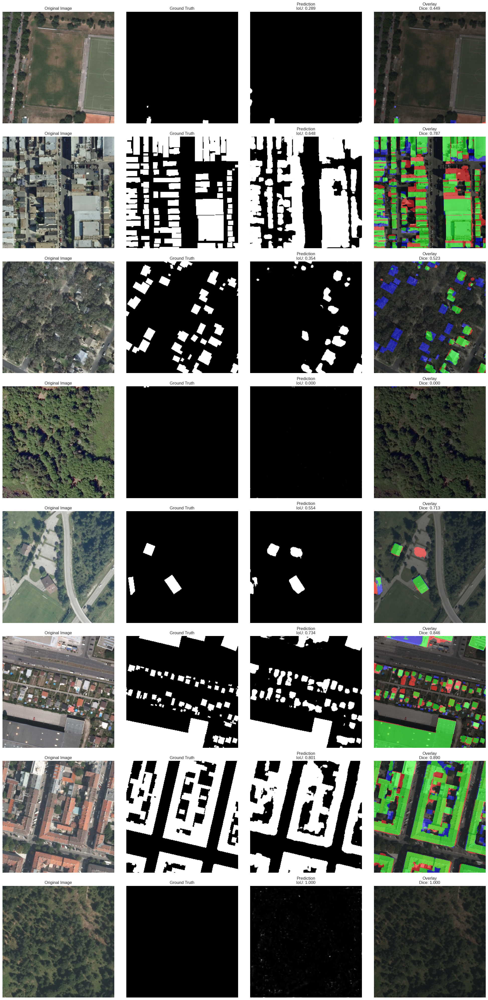

In [28]:
# Показываем примеры предсказаний
model.eval()

# Выбираем случайные примеры
num_samples = 8
sample_indices = np.random.choice(len(test_dataset), num_samples, replace=False)

fig, axes = plt.subplots(num_samples, 4, figsize=(20, 5 * num_samples))

with torch.no_grad():
    for i, idx in enumerate(sample_indices):
        sample = test_dataset[idx]
        image = sample['image'].unsqueeze(0).to(DEVICE)
        mask_tensor = sample['mask'].unsqueeze(0)  # тензор

        # Предсказание
        output = model(image)
        prediction_tensor = torch.sigmoid(output).squeeze().unsqueeze(0).cpu()  # тензор

        # Метрики
        metrics = SegmentationMetrics.calculate_all_metrics(
            prediction_tensor,
            mask_tensor
        )

        # Конвертируем для визуализации
        prediction = prediction_tensor.squeeze().numpy()
        mask = mask_tensor.squeeze().numpy()

        # Денормализация изображения
        img_np = image.squeeze().cpu().numpy().transpose(1, 2, 0)
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        img_np = img_np * std + mean
        img_np = np.clip(img_np, 0, 1)

        # Метрики для этого примера
        metrics = SegmentationMetrics.calculate_all_metrics(
            torch.from_numpy(prediction).unsqueeze(0),
            torch.from_numpy(mask).unsqueeze(0)
        )

        # Original
        axes[i, 0].imshow(img_np)
        axes[i, 0].set_title('Original Image')
        axes[i, 0].axis('off')

        # Ground Truth
        axes[i, 1].imshow(mask, cmap='gray')
        axes[i, 1].set_title('Ground Truth')
        axes[i, 1].axis('off')

        # Prediction
        axes[i, 2].imshow(prediction, cmap='gray')
        axes[i, 2].set_title(f'Prediction\nIoU: {metrics["iou"]:.3f}')
        axes[i, 2].axis('off')

        # Comparison (Green=TP, Red=FP, Blue=FN)
        pred_binary = (prediction > 0.5).astype(np.uint8)
        mask_binary = (mask > 0.5).astype(np.uint8)

        comparison = np.zeros((*mask.shape, 3))
        tp = (pred_binary == 1) & (mask_binary == 1)
        fp = (pred_binary == 1) & (mask_binary == 0)
        fn = (pred_binary == 0) & (mask_binary == 1)

        comparison[tp] = [0, 1, 0]  # Green
        comparison[fp] = [1, 0, 0]  # Red
        comparison[fn] = [0, 0, 1]  # Blue

        axes[i, 3].imshow(img_np)
        axes[i, 3].imshow(comparison, alpha=0.5)
        axes[i, 3].set_title(f'Overlay\nDice: {metrics["dice"]:.3f}')
        axes[i, 3].axis('off')

plt.tight_layout()
plt.show()

---
# Выводы

1. Данные загружены и разбиты на train val test выборки.

Статистики тренировочной и валидационной выборки похожи, что хорошо.

Недостаток, в том что много зданий порезаны краями снимков, что может ухудшить качество предсказаний. Однако, обучение на снимках, например 1024x1024, где эти недостатки были бы менее выражены, будет занимать гораздо больше времени (resize же лучше не делать так как он будет размывать границы зданий), поэтому обработку исходных снимков считаю оптимальной


2. Обучены модели

Unet (обычный) и Unet(Билинейная интерполяция вместо ConvTranspose) - локально

Unet++ (Вложенные skip connections) - в данном ноутбуке


Unet_bilinear (dice loss) - IoU: 0,66 (20 эпох)

Unet++ (combined loss) - IoU: 0,65 (10 эпох)

Unet (dice loss)  --------- IoU: 0,63 (10 эпох)

Лучше всех на валидации Unet_bilinear с dice лоссом. Unet (обычный) и Unet++ с другими лоссами отенциально дали бы качество лучше, но не успел доучить до дедлайна

3. Тестирование

Для лучшей модели на тестовых данных IOU            : 0.67

Визуально здания выглядят похоже на gt , контуры нечеткие, машины и дороги модель за здания не принимает (для сэмплов приведенных выше, в некоторых случаях всеже замечал такое)

на третьем семпле выше модель не распознала здания скрытые деревьями, но и я своими глазами их не вижу

4. Рекомендации по улучшению

обучить больше эпох - ни одна модель еще не вышла на плато.

Рассмотреть другие лоссы

Добавить постобработку по удалению маленьких объектов

Чтобы сделать контуры зданий четче можно обучать модели без ресайза, но это долго. В данном случае ресайз до 256 для ускорения

5. Приложение

Код приложения и инструкции по запуску в репозитории
https://github.com/my-name-is-my-name/GeoData

**Краткое описание приложения:**

-Загружаете спутниковый снимок

-Указываете масштаб одним из способов:

Автоматически из метаданных GeoTIFF

Вручную: "метров на пиксель"

Через реальные размеры участка

- Получаете площадь застройки в м²

**Особенности:**

Оптимально для снимков из Inria Aerial Dataset (0.3 м/пикс)

Для других снимков точность может быть ниже

Для больших изображений используется Sliding window - снимок разрезается на патчи 512x512 пикселей

Для маленьких изображений используется паддинг до 512x512 с сохранением оригинального изображения в центре



